# Cell type labeling, plotting, and differential gene expression analysis

# Notebook setup

In [1]:
from itertools import chain
from itertools import product
import numpy as np
import anndata as ad
import pandas as pd

import scanpy as sc
import scanpy.external as sce

# import scvelo as scv
# import cellrank as cr
import seaborn as sns
from scipy import io
from scipy import sparse

import gc
gc.enable()

In [2]:
import os
os.chdir('/local/workdir/dwm269/scCardiacOrganoid/')

In [3]:
from scripts.py.utils import *
from scripts.py.plots import *

In [4]:
# Load metadata
meta = pd.read_csv("resources/metadata.csv")
meta = meta.loc[meta["source"]=="Hoang et al",]
meta = meta.loc[meta["include"],]
meta.index = list(range(0, len(meta)))
meta

,sample,include,data.dir,pattern,pattern_int,timepoint,time_int,cell_line,source,soupx,soupx_rho_GeneFull
0,D0_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D0,0,GCaMP6f hiPSCs,Hoang et al,False,NaN
1,D1_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D1,1,GCaMP6f hiPSCs,Hoang et al,False,NaN
2,D4_200um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.076
3,D4_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.070
4,D4_1000um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,1000um,1000.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.140
5,D6_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D6,6,GCaMP6f hiPSCs,Hoang et al,True,0.029
6,D8_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D8,8,GCaMP6f hiPSCs,Hoang et al,True,0.015
7,D12_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D12,12,GCaMP6f hiPSCs,Hoang et al,True,0.017
8,D21_200um_B,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.011
9,D21_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.039


## Load in preprocessed data

In [5]:
adata = sc.read_h5ad(
    filename="data/pyobjs/scCO_v1a.h5ad" 
)

# https://github.com/scverse/scanpy/issues/2239
adata.uns['log1p']["base"] = None 

### Clustering summary plots

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


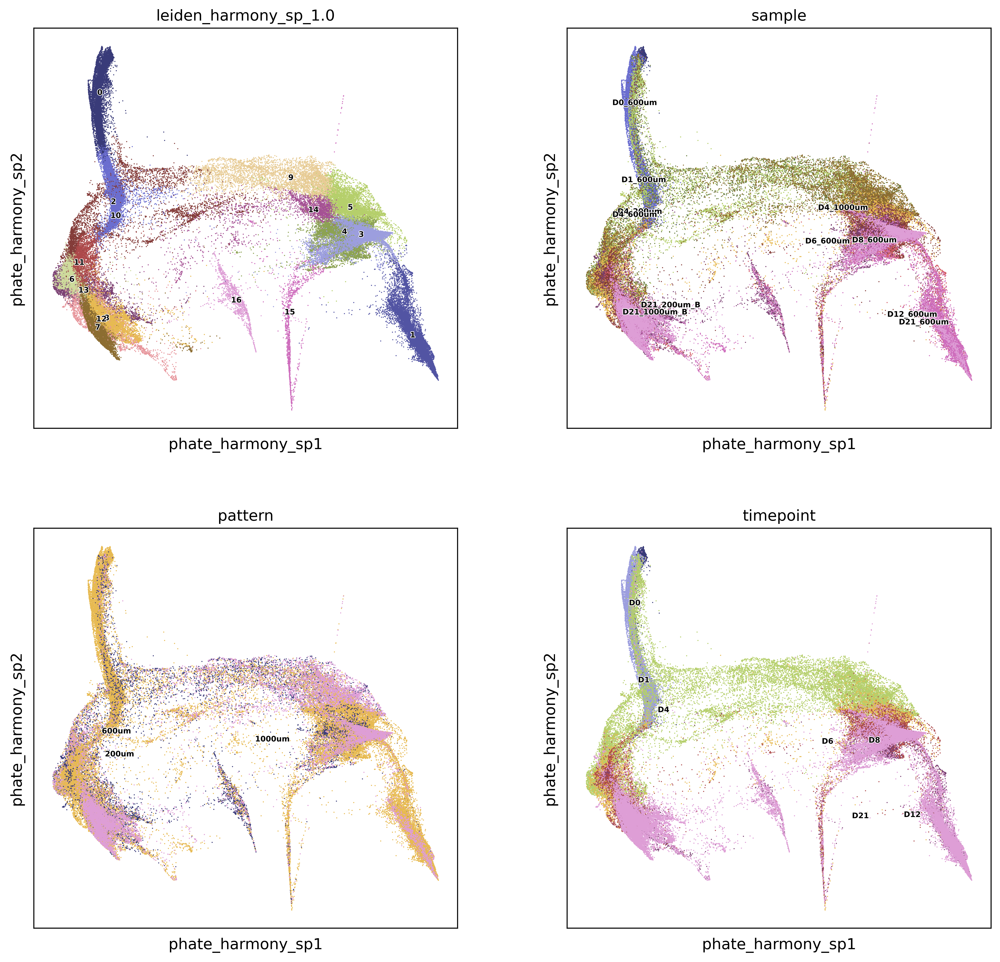

In [6]:
sc.set_figure_params(
    figsize=(6,6),
    fontsize=12,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['leiden_harmony_sp_1.0'],  #'leiden_harmony', , 'leiden_harmony_s_1.0'
#     color = ['APOA1','KDR', 'FAM184A','CDH2'],
#     color = ['GATA2','GATA3', 'GATA4','GATA6'],
    color=['leiden_harmony_sp_1.0','sample','pattern','timepoint'],
#     edges=True, edges_width=0.01, 
    edges=False, legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='viridis',
    size=3,
    sort_order=True,
    ncols=2
)

# Annotate cell types

Canonical genes list, `genes_dict`:

In [8]:
genes_dict = read_csv_to_dict("resources/gene_lists/gene_markers_v3.csv")
genes_dict

{'Epiblast': ['CDH1', 'NANOG', 'POU5F1', 'SOX2', 'ST3GAL2'],
 'Primitive Streak': ['EOMES', 'MIXL1', 'NODAL', 'SNAI2', 'TBXT'],
 'Cardiac Mesoderm': ['APLNR', 'ISL1', 'MESP1', 'NCAM1', 'SMARCD3', 'SNAI1'],
 'Smooth Muscle': ['ACTA2', 'CNN1', 'MYH11', 'SMTN'],
 'Cardiac Fibroblasts': ['COL1A1', 'HAPLN1', 'HAS2', 'NPC2', 'TCF21', 'VIM'],
 'Epicardial': ['LHX2', 'WT1', 'TBX18', 'TMEM88'],
 'Endocardial': ['CD34', 'CDH5', 'ENG', 'KDR', 'PECAM1'],
 'Mesothelial': ['ANKRD1', 'PODXL', 'TAGLN'],
 'Cardiomyocyte': ['MYH6', 'MYL4', 'NKX2-5', 'TBX5', 'TNNC1', 'TTN'],
 'Foregut': ['CDH6', 'FOXA1', 'HHEX', 'ONECUT2', 'SOX9'],
 'Hepato': ['ALB', 'APOA2', 'APOB', 'FGA', 'HNF4A'],
 'Ectoderm': ['GABRP', 'GATA3', 'KRT7', 'WNT6', 'TFAP2A', 'VTCN1'],
 'DE Genes': ['SOX17', 'FOXA2', 'EPCAM', 'SOX7', 'SERPINE2']}

Filter out genes that were not detected

In [9]:
for CT in genes_dict.keys():
    genes_dict[CT] = [k for k in genes_dict[CT] if k in adata.var_names]

genes_dict

{'Epiblast': ['CDH1', 'NANOG', 'POU5F1', 'ST3GAL2'],
 'Primitive Streak': ['EOMES', 'MIXL1', 'NODAL'],
 'Cardiac Mesoderm': ['APLNR', 'ISL1', 'MESP1', 'NCAM1', 'SMARCD3', 'SNAI1'],
 'Smooth Muscle': ['ACTA2', 'CNN1', 'SMTN'],
 'Cardiac Fibroblasts': ['COL1A1', 'HAPLN1', 'HAS2', 'NPC2', 'VIM'],
 'Epicardial': ['LHX2', 'WT1', 'TBX18', 'TMEM88'],
 'Endocardial': ['CD34', 'CDH5', 'ENG', 'KDR', 'PECAM1'],
 'Mesothelial': ['ANKRD1', 'PODXL', 'TAGLN'],
 'Cardiomyocyte': ['MYH6', 'MYL4', 'NKX2-5', 'TBX5', 'TNNC1', 'TTN'],
 'Foregut': ['CDH6', 'FOXA1', 'HHEX', 'ONECUT2', 'SOX9'],
 'Hepato': ['ALB', 'APOA2', 'APOB', 'FGA', 'HNF4A'],
 'Ectoderm': ['GABRP', 'GATA3', 'KRT7', 'WNT6', 'TFAP2A', 'VTCN1'],
 'DE Genes': ['FOXA2', 'EPCAM', 'SERPINE2']}

## Cell type annotations
- based on `harmony_sp` embedding
- batch correction run on sample ID and cell cycle stage

### Top genes by cluster

In [10]:
sc.tl.rank_genes_groups(
    adata, 
    groupby='leiden_harmony_sp_1.0', 
    method='wilcoxon',
    layer='data',
    pts=True
)

In [11]:
tmp = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print(tmp.iloc()[1:20,:])

                0       1         2        3         4          5  \
1           SFRP2  SLC8A1     SFRP2   COL1A1    COL3A1     HAPLN1   
2    CTD-2306M5.1  PDLIM5    MT-ND4   COL6A2   ZNRF2P2       HAS2   
3    RP11-415G4.1    RYR2    MT-CO2   COL1A2    COL1A1      CGNL1   
4   RP11-436D23.1    MYL4       RAN      VIM    COBLL1      BMPER   
5             CD9  CTNNA3   MT-ATP6    ZFPM2      SOX6      TENM4   
6            XACT    MYL7       CD9     ZEB2    AKAP12        VIM   
7         GALNT17   TNNI1      CYCS   COL5A2      BNC2    DYNC1I1   
8           DPPA4     PLN  HSP90AA1   PDZRN4    TMEM98    RHOBTB3   
9          SEMA6A   ACTC1     HMGA1    IL6ST   SEPTIN7     TMEM88   
10          ADCY2   CHRM2     C1QBP    FREM1  SLC9A3R1      MEIS1   
11         PTPRZ1    TPM1    MT-CO3   IGFBP7   ARHGAP6      CDK14   
12          L1TD1   MYOM1     HSPD1   COL6A3    CCDC80     PTPN13   
13           SYT1  FILIP1     GAPDH    CDH11       EZR       CDK6   
14            TKT   PALLD     PRDX

categories: 0, 1, 2, etc.
var_group_labels: 16


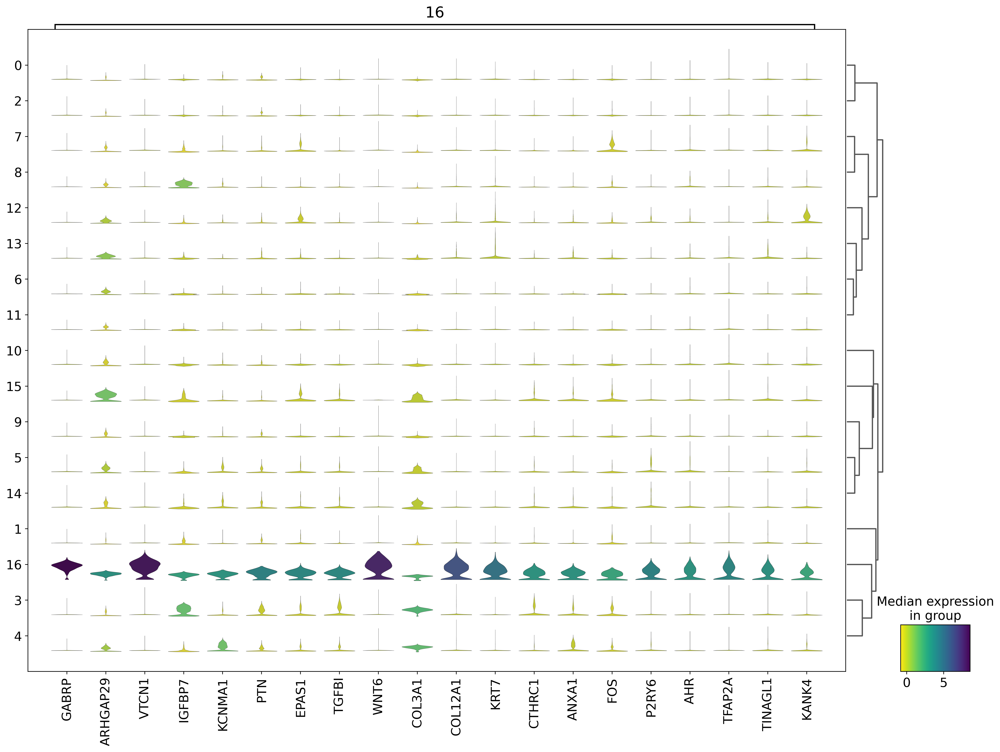

In [12]:
sc.set_figure_params(
    # figsize=(12,16),
    fontsize=18,
    transparent=False,
    dpi=200
)
if False:
    sc.tl.dendrogram(
        adata,
        # groupby="leiden_harmony_sp_1.0",
        groupby=groupby,
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.rank_genes_groups_stacked_violin(
    adata,
    n_genes=20,
    groups=["16"],
    min_logfoldchange=4,
    cmap='viridis_r',
    figsize=(20,14)
)

In [13]:
genes_16 = {
    "16":["GABRP", "VTCN1", "WNT6","COL12A1","KRT7","EPAS1","TGFBI","P2RY6","TFAP2A","TINAGL1","FOS","ANXA1","CTHRC1","PTN"]
}

categories: 0, 1, 2, etc.
var_group_labels: 16


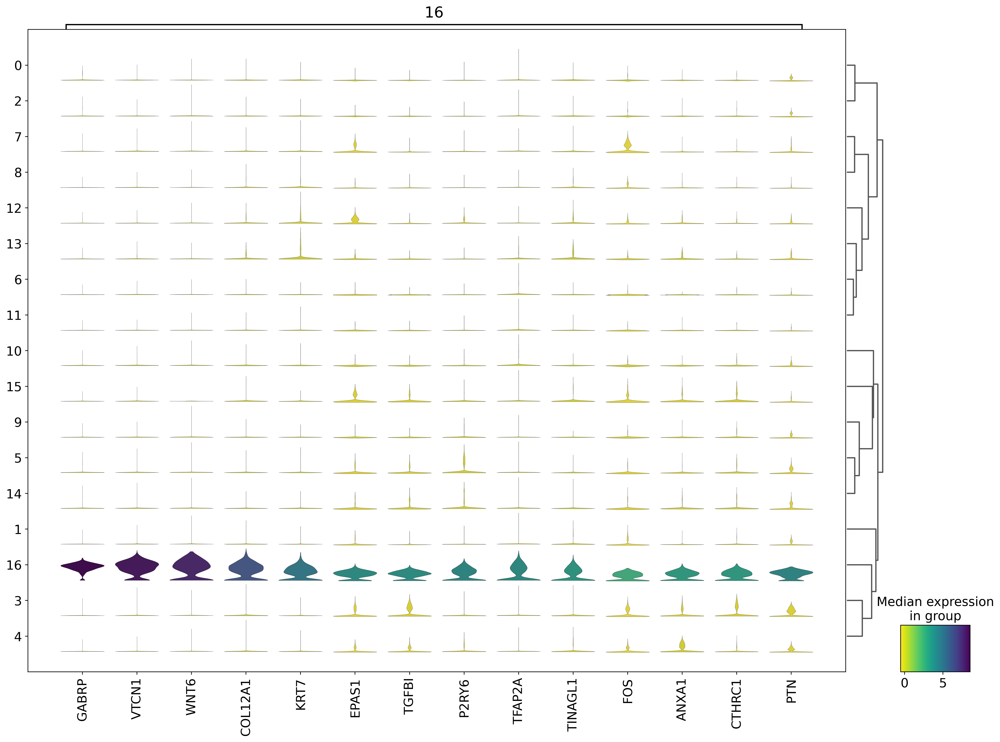

In [14]:
sc.pl.stacked_violin(
    adata,  
    genes_16,
    groups=["16"],
    groupby='leiden_harmony_sp_1.0',
    cmap='viridis_r',
    dendrogram=True,
    figsize=(20,14)
)

### PHATE plots

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


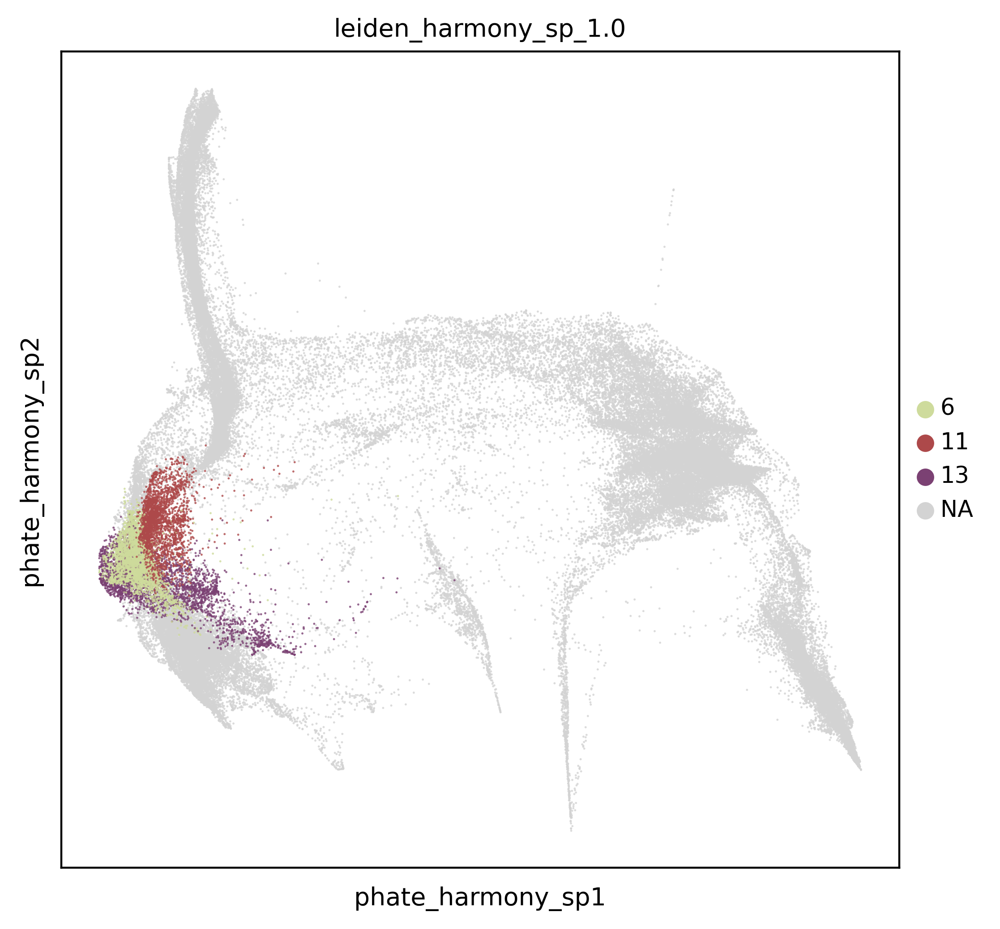

In [15]:
sc.set_figure_params(
    figsize=(6,6),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['cell_types'], 
    color="leiden_harmony_sp_1.0",
    groups =["6","11","13"],
    # color=['pattern'],
    # edges=True, edges_width=0.01, 
    # legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
    ncols=3
)

### DotPlot(s)

categories: 0, 1, 2, etc.
var_group_labels: Epiblast, Primitive Streak, Cardiac Mesoderm, etc.


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


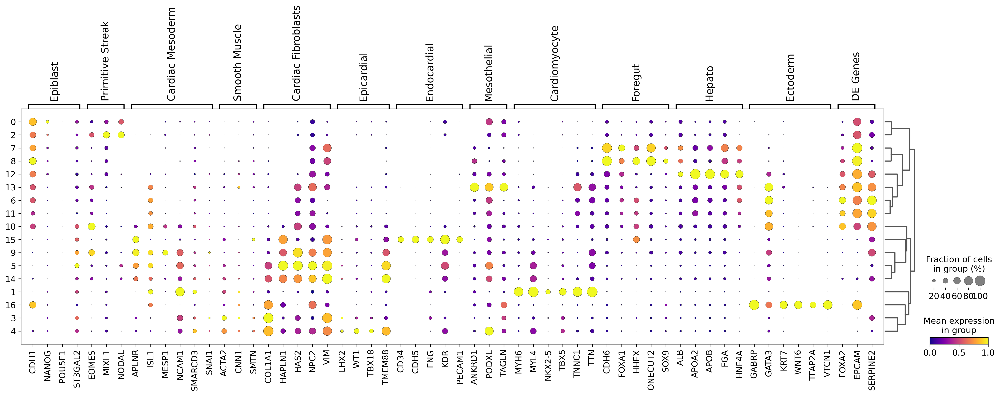

In [16]:
sc.set_figure_params(
    figsize=(3,3),
    dpi=150,
    transparent=True
)

#'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS', 'Mesendoderm_Prim_Endoderm', 
# 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver','Gut_Mesenchyme', 'Endoderm_Gut_Cells'
#'Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle', 'Cardiac_Mesoderm', 
# 'Endocardial', 'Epicardial', 
# 'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'

tmp_cell_type=[
    # 'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS',# 'Mesendoderm_Prim_Endoderm'
    # 'Gut_Mesenchyme', 'Endoderm_Gut_Cells',#'Gut_Silva'    
    # 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver'
    # 'Cardiac_Mesoderm','Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle',
    # 'Endocardial', 'Epicardial',
    'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'
]

if False: #switch for whether or not to recompute dendrogram...
    sc.tl.dendrogram(
        adata,
        # groupby="leiden_harmony_sp_1.0",
        groupby="leiden_harmony_sp_anno",
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.dotplot(
    adata,
    # var_names={key:genes_dict[key] for key in tmp_cell_type},# title=tmp_cell_type,
    var_names=genes_dict,
    groupby="leiden_harmony_sp_1.0",
    # groupby="leiden_harmony_sp_anno",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

categories: 0, 1, 2, etc.
var_group_labels: Epiblast, Primitive Streak, Cardiac Mesoderm, etc.


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


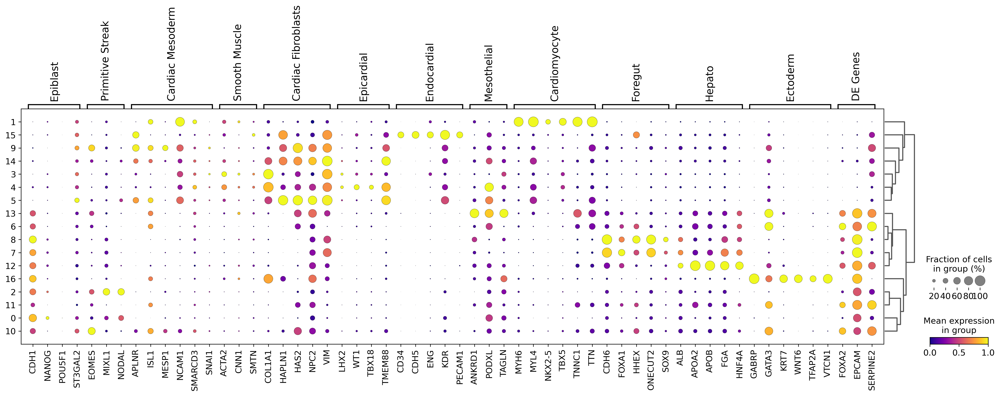

In [19]:
sc.set_figure_params(
    figsize=(3,3),
    dpi=150,
    transparent=True
)

tmp_cell_type=[
    'iPSC', 'Prim_Streak', 'Cardiac_Mesoderm', 'Definitive_Endoderm', 
    'Smooth_Muscle', 'Stromal_Fibroblasts', 'Epicardial', 'Endocardial', 'Cardiomyocytes', 
    'Foregut_Epithelium', 'Gut_Mesenchyme', 'Liver_Progenitor'
]

if True: #switch for whether or not to recompute dendrogram...
    sc.tl.dendrogram(
        adata,
        groupby="leiden_harmony_sp_1.0",
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.dotplot(
    adata,
    var_names=genes_dict,
    # var_names=genes_dict,
    groupby="leiden_harmony_sp_1.0",
    # groupby="cell_types",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

Label clusters using resolution value of 1.0

In [20]:
# Low-level clustering, 
old_to_new = {
    '0':'Pluripotent',
    '1':'Mesoderm', 
    '2':'Pluripotent', 
    '3':'Mesoderm', 
    '4':'Mesoderm',
    '5':'Mesoderm', 
    '6':'Endoderm', 
    '7':'Endoderm',
    '8':'Endoderm', 
    '9':'Mesoderm', 
    '10':'Pluripotent',
    '11':'Endoderm', 
    '12':'Endoderm', 
    '13':'Endoderm', 
    '14':'Mesoderm',
    '15':'Mesoderm',
    '16':'Ectoderm'
}
adata.obs['cell_types_level1'] = (
    adata.obs['leiden_harmony_sp_1.0'].map(old_to_new).astype('category')
)
adata.obs['cell_types_level1'].value_counts()

Mesoderm       41939
Pluripotent    27255
Endoderm       26053
Ectoderm        1154
Name: cell_types_level1, dtype: int64

In [21]:
# res = 1.0
old_to_new = {
    '0':'iPSCs',
    '1':'Cardiomyocytes', 
    '2':'Primitive_Streak', 
    '3':'SMCs/myofibroblasts', 
    '4':'Epicardial',
    '5':'Fibroblasts', 
    '6':'Definitive_Endoderm', 
    '7':'Foregut_Epithelium',
    '8':'Foregut_Epithelium', 
    '9':'Cardiac_Mesoderm', 
    '10':'Primitive_Streak',
    '11':'Definitive_Endoderm', 
    '12':'Liver_Progenitors', 
    '13':'Mesothelial', 
    '14':'Fibroblasts',
    '15':'Endocardial',
    '16':'Non-neural_Ectoderm'
}
adata.obs['cell_types_level2'] = (
    adata.obs['leiden_harmony_sp_1.0'].map(old_to_new).astype('category')
)
adata.obs['cell_types_level2'].value_counts()

Primitive_Streak       14323
iPSCs                  12932
Cardiomyocytes         10882
Foregut_Epithelium     10228
Definitive_Endoderm     9879
Fibroblasts             9317
SMCs/myofibroblasts     8808
Epicardial              7199
Cardiac_Mesoderm        4498
Liver_Progenitors       3229
Mesothelial             2717
Endocardial             1235
Non-neural_Ectoderm     1154
Name: cell_types_level2, dtype: int64

In [22]:
gc.collect()

56430

Plots after cell type annotations

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


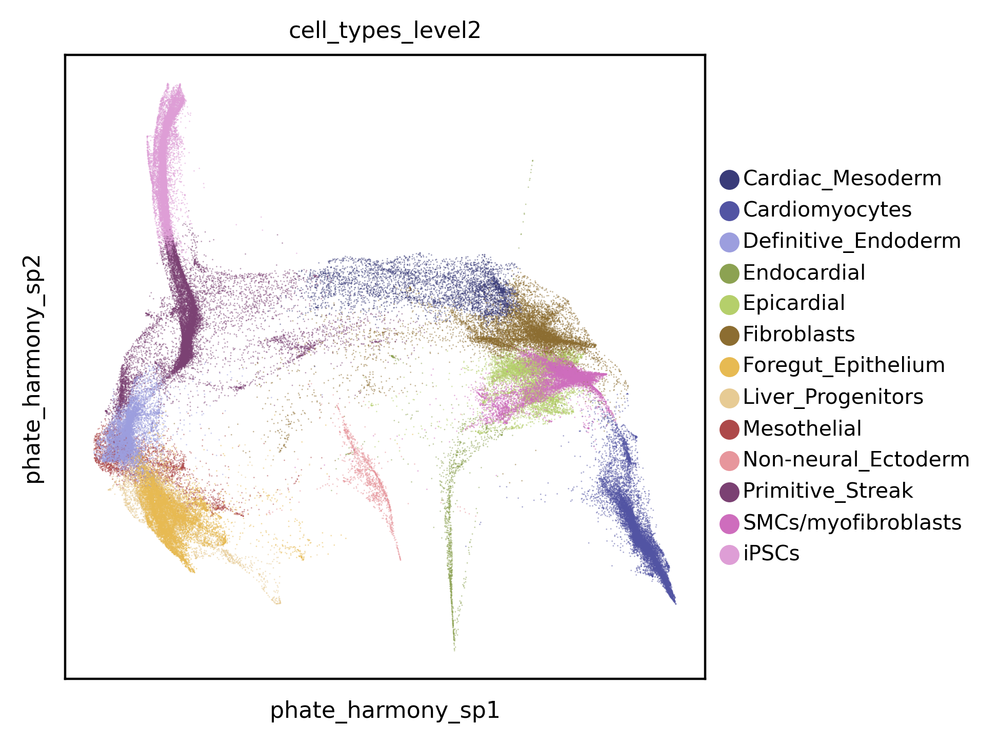

In [23]:
sc.set_figure_params(
    figsize=(4,4),
    fontsize=8,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    color=['cell_types_level2'], #,'pattern'
#     color=['leiden_harmony_types'],
    # edges=True, edges_width=0.01,
    # legend_loc='on data', legend_fontsize=6, legend_fontoutline=0.75, #labels on plot
    palette='tab20b',
    size=1, alpha=0.5,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

categories: Cardiac_Mesoderm, Cardiomyocytes, Definitive_Endoderm, etc.
var_group_labels: Epiblast, Primitive Streak, Cardiac Mesoderm, etc.


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


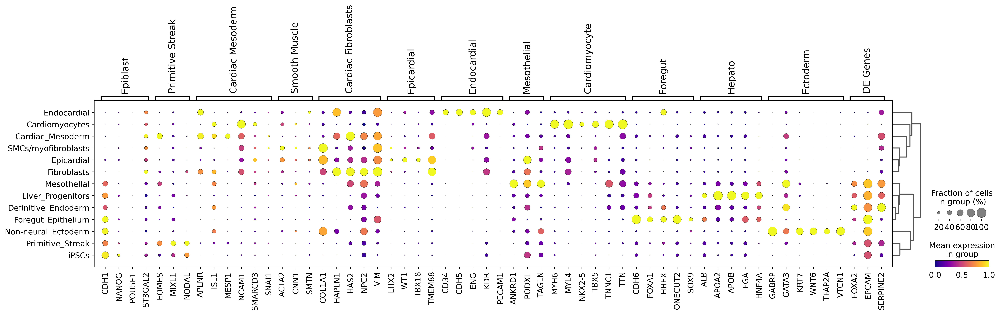

In [24]:
sc.set_figure_params(
    figsize=(3,3),
    dpi=200,
    transparent=True
)

if True: #switch for whether or not to recompute dendrogram...
    sc.tl.dendrogram(
        adata,
        # groupby="leiden_harmony_sp_1.0",
        groupby="cell_types_level2",
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.dotplot(
    adata,
    var_names = genes_dict,
    groupby="cell_types_level2",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

DGEA

In [25]:
sc.tl.rank_genes_groups(
    adata, 
    groupby='leiden_harmony_sp_anno', 
    method='wilcoxon',
    layer='data',   
    pts=True
)
# sc.tl.filter_rank_genes_groups(
#     adata, 
#     key_added="filtered_genes_groups",
#     min_in_group_fraction = 0.3,
#     max_out_group_fraction = 0.3,
#     min_fold_change=2
# )

In [26]:
export_dgea_to_csv(
    adata=adata,
    dgea_name='rank_genes_groups',
    n_features=100,
    axis=0,
    csv_out='resources/dgea/mesoderm/scco_v1b_level2.csv'
)

# Save preprocessed object for future analyses (python & R)

Adjust the metadata column names to enable conversion to `.h5seurat` file
- Borrowed from [erosix](https://github.com/erosix) [here](https://github.com/mojaveazure/seurat-disk/issues/100)

In [27]:
# adata.obs.columns = [sub.replace('(', '') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace(')', '') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace('/', '') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace('=', '.') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace(' ', '_') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace('-', '_') for sub in adata.obs.columns]

In [28]:
adata.write(
    "data/pyobjs/scCO_v1b.h5ad"
)

see `scripts/R/convert_h5ad_to_seurat.R` for info conversion to Seurat

In [29]:
gc.collect()

26999